# What is the link between Polytechnique Montreal & Many worlds interpretation?

In [1]:
from bs4 import BeautifulSoup
from selenium import webdriver
import networkx as nx
import matplotlib.pyplot as plt
import wikipedia 


graph=nx.Graph()
dictionnary_of_links={}
list_of_links=[]


#enter the name of the mapped wikipedia page
search_term = input("which wikipedia page would you like mapped ?")

which wikipedia page would you like mapped ?Polytechnique Montreal


In [2]:
result_list = wikipedia.search(search_term)

print(result_list)

final_choice = input("pick the index  (begins at 1)  of the wikipedia page you want to see mapped")
 

['Polytechnique Montréal', 'Polytechnique (film)', 'École Polytechnique', 'École Polytechnique massacre', 'Université de Montréal', 'HEC Montréal', 'SNC-Lavalin', 'Renato Giuseppe Bosisio', 'Michèle Thibodeau-DeGuire', 'École Polytechnique (disambiguation)']
pick the index  (begins at 1)  of the wikipedia page you want to see mapped1


In [3]:
#original wikipedia page that we want mapped
try:
    original_page = wikipedia.page(wikipedia.search(search_term)[int(final_choice) - 1])
except wikipedia.exceptions.DisambiguationError:
    original_page = wikipedia.page(wikipedia.search(search_term)[int(final_choice)])
#extarcting the "what links here" page that lists all the linked articles to the original page we want mapped
prefix_url = 'https://en.wikipedia.org/w/index.php?title=Special:WhatLinksHere/'
suffix_url ='&namespace=0&limit=500&hideredirs=1'
title_original_page = original_page.title.replace(' ','_')
original_url = prefix_url + title_original_page + suffix_url

#Adding the original_page's title as the first central node in the graph
#title=soup.find('span',id='specialDeleteTarget').text
graph.add_node(title_original_page)

#using automated webbrowser selenium instead of Wikipedia API because the number of requests is limited
browser =  webdriver.Chrome(executable_path='C:/Users/Dell/PycharmProjects/zombienight/chromedriver')
browser.get(original_url)

#parsing the "what links here " page of the original wiki page using BeautifulSoup
soup = BeautifulSoup(browser.page_source, "html.parser")

#containers is where we store ul element composed of the linked articles (title+link) as li elements
containers=soup.find('ul',id='mw-whatlinkshere-list')

#we are only interested in the first 6 articles who link to the original page.Since they allows to obtain a satisfactory grasp of a wiki map
for element in containers.find_all('li')[0:6]:
    #in list_of_links we store the links of the articles (who link to the original page)
    list_of_links.append(element.a['href'])
    if  element.text not in graph.nodes():
        graph.add_node(element.a['title'])
    graph.add_edge(title_original_page,element.a['title']) 
    
dictionnary_of_links[title_original_page]=list_of_links    

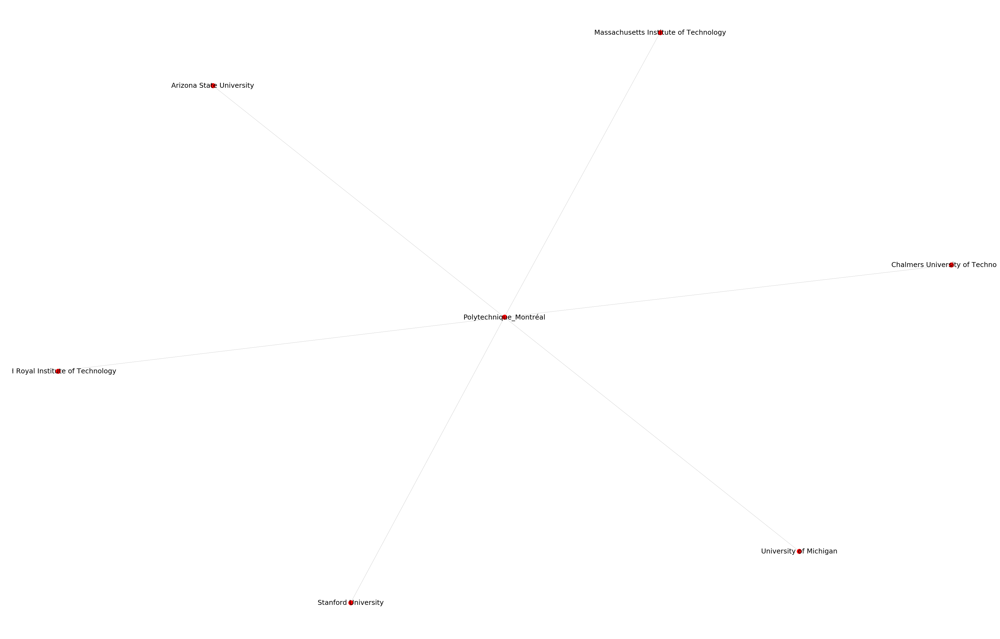

In [4]:
#drawing the first iteration graph

plt.figure(25,figsize=(50,32))
nx.draw_spring(graph,width=0.2,with_labels=True,font_size=25)


In [5]:
#number of the nodes after the first iteration is 
print(len(graph))# is at maximum 7= original_node + 6 first articles who link to the orginal node


7


In [6]:
#second iteraion: for each one of the 6 articles linking to the original_page 
#we apply the same algorithm ie: mapping their first 6 article who link to them 
from requests import get

base_url='https://en.wikipedia.org'

for link in dictionnary_of_links[title_original_page]:
    
    list_of_links=[]
    page_url = base_url + link
    
    response = get(page_url)
    soup = BeautifulSoup(response.text, 'html.parser')
    
    #we need to get the name of the wikipedia page from it's link 
    name_of_link=soup.find('li',id='t-whatlinkshere')
    
    #the url here is the url of the "what links here" page of the current link in the loop of the original node
    
    url=prefix_url+name_of_link.a['href'][28:]+suffix_url
    browser.get(url)
    soup = BeautifulSoup(browser.page_source, "html.parser")
    
    # the title is the title of the wiki page correpsonding to the link 
    title=soup.find('span',id='specialDeleteTarget').text
    
    #same process as before iterating through the first 6 wiki article who link to the current page 
    containers=soup.find('ul',id='mw-whatlinkshere-list')
    for element in containers.find_all('li')[0:6]:
        list_of_links.append(element.a['href'])
        if  element.text not in graph.nodes():
            graph.add_node(element.a['title'])
        graph.add_edge(title,element.a['title'])   
    dictionnary_of_links[title]=list_of_links   

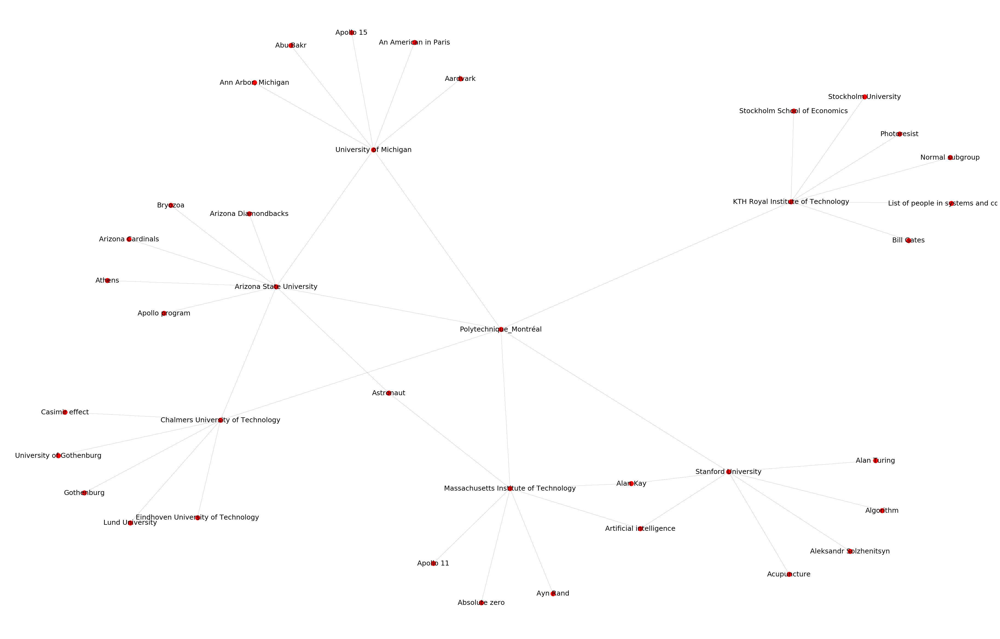

In [7]:
#drawing the second iteration graph
plt.figure(25,figsize=(50,32))
nx.draw_spring(graph,width=0.2,with_labels=True,font_size=25)

In [8]:
#number of the nodes after the second iteration is 
print(len(graph))# is at the maximum 6*6 + 2 = 38 if there isnt any repeated/shared links



38


In [9]:
# third iteration: the same algorithm is applied for the last nodes created 
#as the 6 new nodes of each of the 6 nodes of the 6 first articles who linked to the original node
graph_original_nodes=list(dictionnary_of_links.keys())
for node in graph_original_nodes:
    
    for link in dictionnary_of_links[node]:
        
        list_of_links=[]

        page_url=base_url + link
        response = get(page_url)
        soup = BeautifulSoup(response.text, 'html.parser')
        
        name_of_link=soup.find('li',id='t-whatlinkshere')
        url=prefix_url + name_of_link.a['href'][28:] + suffix_url
        browser.get(url)
        soup = BeautifulSoup(browser.page_source, "html.parser")
        title=soup.find('span',id='specialDeleteTarget').text
        

        containers=soup.find('ul',id='mw-whatlinkshere-list')
        for element in containers.find_all('li')[0:6]:
            list_of_links.append(element.a['href'])
            if  element.text not in graph.nodes():
                graph.add_node(element.a['title'])
            graph.add_edge(title,element.a['title'])   
        dictionnary_of_links[title]=list_of_links   

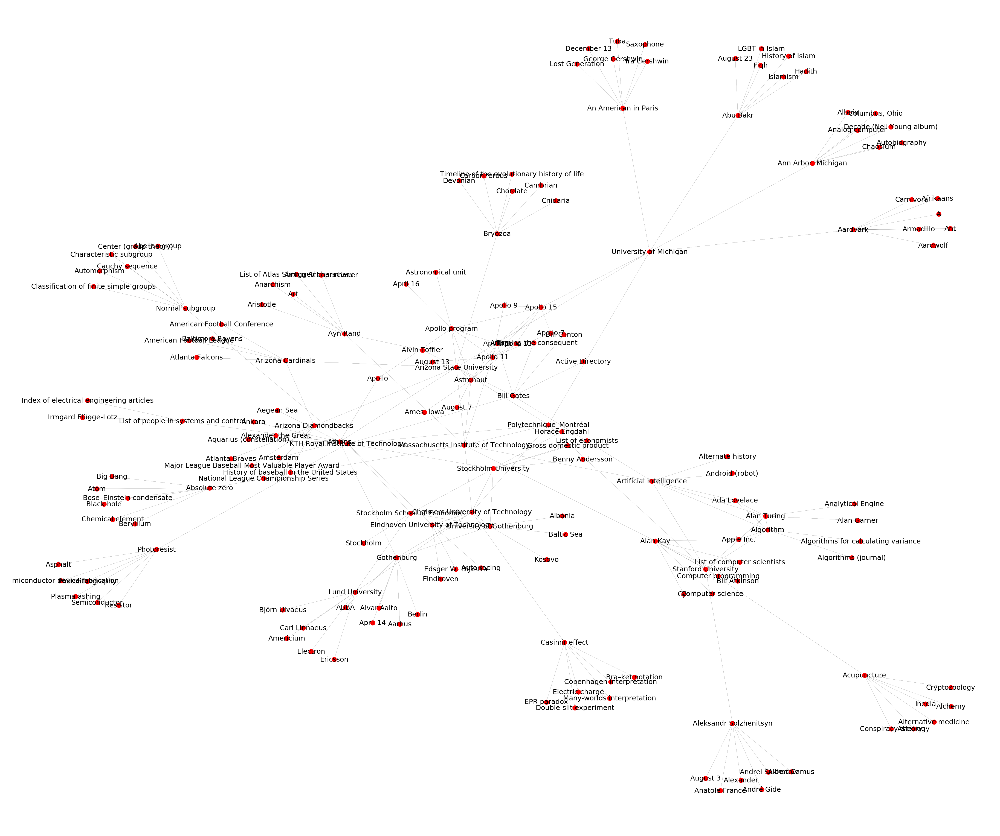

In [10]:
plt.figure(25,figsize=(50,42))
nx.draw_spring(graph,width=0.2,with_labels=True,font_size=25)

In [11]:
#number of the nodes after the third iteration is 
print(len(graph))# is at the maximum (37-7)*6 = 240  if there isnt any repeated/shared links

172


In [12]:
# fourth iteration
# we could have also created a function instead of copying the code (for a future commit)
graph_original_nodes=list(dictionnary_of_links.keys())
for node in graph_original_nodes:
    #ase='https://en.wikipedia.org'
    for link in dictionnary_of_links[node]:
        
        list_of_links=[]

        page_url=base_url + link
        response = get(page_url)
        soup = BeautifulSoup(response.text, 'html.parser')
        
        name_of_link=soup.find('li',id='t-whatlinkshere')
        url=prefix_url + name_of_link.a['href'][28:] + suffix_url
        browser.get(url)
        soup = BeautifulSoup(browser.page_source, "html.parser")
        title=soup.find('span',id='specialDeleteTarget').text
        

        containers=soup.find('ul',id='mw-whatlinkshere-list')
        for element in containers.find_all('li')[0:6]:
            list_of_links.append(element.a['href'])
            if  element.text not in graph.nodes():
                graph.add_node(element.a['title'])
            graph.add_edge(title,element.a['title'])   
        dictionnary_of_links[title]=list_of_links   

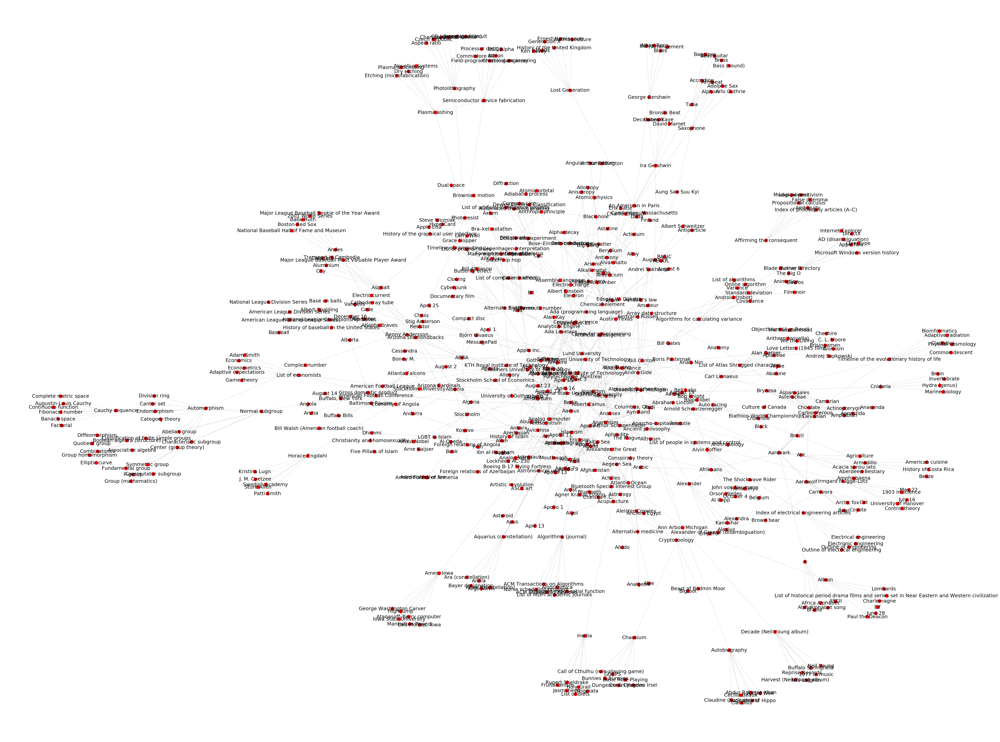

In [13]:
#after the fourth iteration

plt.figure(25,figsize=(70,52))
nx.draw_spring(graph,width=0.2,with_labels=True,font_size=25)

In [14]:
node_list=list(dictionnary_of_links.keys())

In [15]:
print(node_list)

['Polytechnique_Montréal', 'Arizona State University', 'Chalmers University of Technology', 'Massachusetts Institute of Technology', 'KTH Royal Institute of Technology', 'Stanford University', 'University of Michigan', 'Astronaut', 'Athens', 'Apollo program', 'Arizona Cardinals', 'Arizona Diamondbacks', 'Bryozoa', 'Casimir effect', 'Eindhoven University of Technology', 'Gothenburg', 'University of Gothenburg', 'Lund University', 'Ayn Rand', 'Apollo 11', 'Artificial intelligence', 'Absolute zero', 'Alan Kay', 'Bill Gates', 'Normal subgroup', 'Photoresist', 'Stockholm School of Economics', 'Stockholm University', 'List of people in systems and control', 'Algorithm', 'Alan Turing', 'Acupuncture', 'Aleksandr Solzhenitsyn', 'An American in Paris', 'Aardvark', 'Abu Bakr', 'Apollo 15', 'Ann Arbor, Michigan', 'Apollo 8', 'Ames, Iowa', 'August 7', 'Apollo 13', 'Apollo', 'Alexander the Great', 'Aquarius (constellation)', 'Ankara', 'Aegean Sea', 'Amsterdam', 'Astronomical unit', 'April 16', 'Amer

In [16]:
choice = input("name of the target node")



name of the target nodeMany-worlds interpretation


['Polytechnique_Montréal', 'Chalmers University of Technology', 'Casimir effect', 'Many-worlds interpretation']


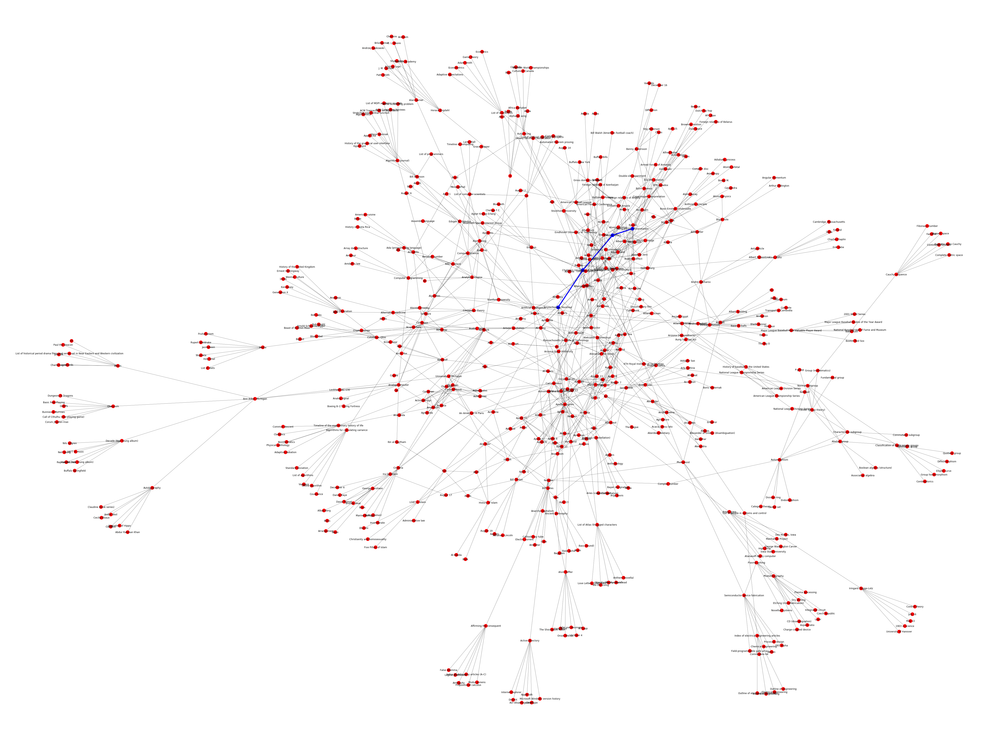

In [17]:
#highlight the shortest path between original node and your choice 

shortestPath=nx.shortest_path(graph,source=title_original_page,target=choice)
print(shortestPath)

for e in graph.edges():
    graph[e[0]][e[1]]['color'] = 'black'
    graph[e[0]][e[1]]['weight'] = 0.5
for i in range(len(shortestPath)-1):
    graph[shortestPath[i]][shortestPath[i+1]]['color'] = 'blue'
    graph[shortestPath[i]][shortestPath[i+1]]['weight'] = 5
edge_color_list = [ graph[e[0]][e[1]]['color'] for e in graph.edges() ] 
node_colors = ["blue" if n in shortestPath else "red" for n in graph.nodes()]
weights = [graph[u][v]['weight'] for u,v in graph.edges] 
plt.figure(25,figsize=(70,52))
nx.draw_spring(graph,edge_color = edge_color_list, with_labels = True,node_color=node_colors, width=weights)